LSGAN

In [1]:
import os
import numpy as np
import tensorflow as tf
from tensorflow.keras import layers
import matplotlib.pyplot as plt

# Config
EPOCHS = 50
BATCH_SIZE = 64
NOISE_DIM = 100
NUM_EXAMPLES_TO_GENERATE = 16
LOG_DIR = "./logs/ls_gan_rgb"
IMG_SAVE_DIR = "./generated_images"
os.makedirs(IMG_SAVE_DIR, exist_ok=True)


In [2]:
# Load MedMNIST dataset (RGB)
data_path = r"C:\Users\laksh\Downloads\dermamnist_224.npz"
data = np.load(data_path)
images = data['train_images']  # (7007, 224, 224, 3)

# Generator that yields RGB images
def data_gen():
    for img in images:
        yield img

# Streaming pipeline
raw_dataset = tf.data.Dataset.from_generator(
    data_gen,
    output_signature=tf.TensorSpec(shape=(224, 224, 3), dtype=tf.uint8)
)

# Preprocess to 64x64 and normalize
def preprocess_pipeline(img):
    img = tf.image.resize(img, [64, 64])
    img = tf.cast(img, tf.float32) / 127.5 - 1.0
    return img

train_dataset = raw_dataset.map(preprocess_pipeline, num_parallel_calls=tf.data.AUTOTUNE)
train_dataset = train_dataset.shuffle(10000).batch(BATCH_SIZE).prefetch(tf.data.AUTOTUNE)


In [3]:
def build_generator():
    model = tf.keras.Sequential([
        layers.Dense(8*8*256, use_bias=False, input_shape=(NOISE_DIM,)),
        layers.BatchNormalization(), layers.LeakyReLU(),
        layers.Reshape((8, 8, 256)),
        layers.Conv2DTranspose(128, 5, strides=2, padding='same', use_bias=False),
        layers.BatchNormalization(), layers.LeakyReLU(),
        layers.Conv2DTranspose(64, 5, strides=2, padding='same', use_bias=False),
        layers.BatchNormalization(), layers.LeakyReLU(),
        layers.Conv2DTranspose(3, 5, strides=2, padding='same', use_bias=False, activation='tanh')
    ])
    return model

def build_discriminator():
    model = tf.keras.Sequential([
        layers.Conv2D(64, 5, strides=2, padding='same', input_shape=(64, 64, 3)),
        layers.LeakyReLU(), layers.Dropout(0.3),
        layers.Conv2D(128, 5, strides=2, padding='same'),
        layers.LeakyReLU(), layers.Dropout(0.3),
        layers.Flatten(), layers.Dense(1)
    ])
    return model


In [4]:
mse = tf.keras.losses.MeanSquaredError()

def discriminator_loss(real_output, fake_output):
    real_loss = mse(tf.ones_like(real_output), real_output)
    fake_loss = mse(tf.zeros_like(fake_output), fake_output)
    return real_loss + fake_loss

def generator_loss(fake_output):
    return mse(tf.ones_like(fake_output), fake_output)

generator = build_generator()
discriminator = build_discriminator()
generator_optimizer = tf.keras.optimizers.Adam(1e-4)
discriminator_optimizer = tf.keras.optimizers.Adam(1e-4)


In [5]:
@tf.function
def train_step(images):
    noise = tf.random.normal([BATCH_SIZE, NOISE_DIM])

    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
        generated = generator(noise, training=True)
        real_output = discriminator(images, training=True)
        fake_output = discriminator(generated, training=True)

        gen_loss = generator_loss(fake_output)
        disc_loss = discriminator_loss(real_output, fake_output)

    gradients_of_generator = gen_tape.gradient(gen_loss, generator.trainable_variables)
    gradients_of_discriminator = disc_tape.gradient(disc_loss, discriminator.trainable_variables)

    generator_optimizer.apply_gradients(zip(gradients_of_generator, generator.trainable_variables))
    discriminator_optimizer.apply_gradients(zip(gradients_of_discriminator, discriminator.trainable_variables))

    return gen_loss, disc_loss


In [6]:
def generate_and_save_images(model, epoch, test_input):
    predictions = model(test_input, training=False)
    predictions = (predictions + 1.0) / 2.0

    fig = plt.figure(figsize=(4, 4))
    for i in range(predictions.shape[0]):
        plt.subplot(4, 4, i+1)
        plt.imshow(predictions[i])
        plt.axis('off')

    plt.suptitle(f"Epoch {epoch}")
    plt.savefig(f"{IMG_SAVE_DIR}/lsgan_epoch_{epoch}.png")
    plt.close()


In [7]:
seed = tf.random.normal([NUM_EXAMPLES_TO_GENERATE, NOISE_DIM])
summary_writer = tf.summary.create_file_writer(LOG_DIR)

for epoch in range(1, EPOCHS + 1):
    for image_batch in train_dataset:
        g_loss, d_loss = train_step(image_batch)

    generate_and_save_images(generator, epoch, seed)

    with summary_writer.as_default():
        tf.summary.scalar("Generator Loss", g_loss, step=epoch)
        tf.summary.scalar("Discriminator Loss", d_loss, step=epoch)

    print(f"Epoch {epoch}: Gen Loss = {g_loss:.4f}, Disc Loss = {d_loss:.4f}")


Epoch 1: Gen Loss = 1.0287, Disc Loss = 0.0881
Epoch 2: Gen Loss = 0.8603, Disc Loss = 0.0375
Epoch 3: Gen Loss = 1.0224, Disc Loss = 0.0198
Epoch 4: Gen Loss = 0.8060, Disc Loss = 0.0400
Epoch 5: Gen Loss = 0.6958, Disc Loss = 0.1100
Epoch 6: Gen Loss = 0.9308, Disc Loss = 0.0694
Epoch 7: Gen Loss = 0.9424, Disc Loss = 0.0858
Epoch 8: Gen Loss = 0.7109, Disc Loss = 0.2988
Epoch 9: Gen Loss = 0.8401, Disc Loss = 0.1170
Epoch 10: Gen Loss = 0.9576, Disc Loss = 0.0628
Epoch 11: Gen Loss = 0.6267, Disc Loss = 0.3049
Epoch 12: Gen Loss = 0.9382, Disc Loss = 0.1141
Epoch 13: Gen Loss = 0.7332, Disc Loss = 0.2977
Epoch 14: Gen Loss = 0.7306, Disc Loss = 0.3215
Epoch 15: Gen Loss = 0.7189, Disc Loss = 0.1617
Epoch 16: Gen Loss = 0.6846, Disc Loss = 0.2969
Epoch 17: Gen Loss = 0.5220, Disc Loss = 0.1772
Epoch 18: Gen Loss = 0.4282, Disc Loss = 0.3552
Epoch 19: Gen Loss = 0.5712, Disc Loss = 0.2901
Epoch 20: Gen Loss = 0.7101, Disc Loss = 0.4326
Epoch 21: Gen Loss = 0.9802, Disc Loss = 0.3405
E

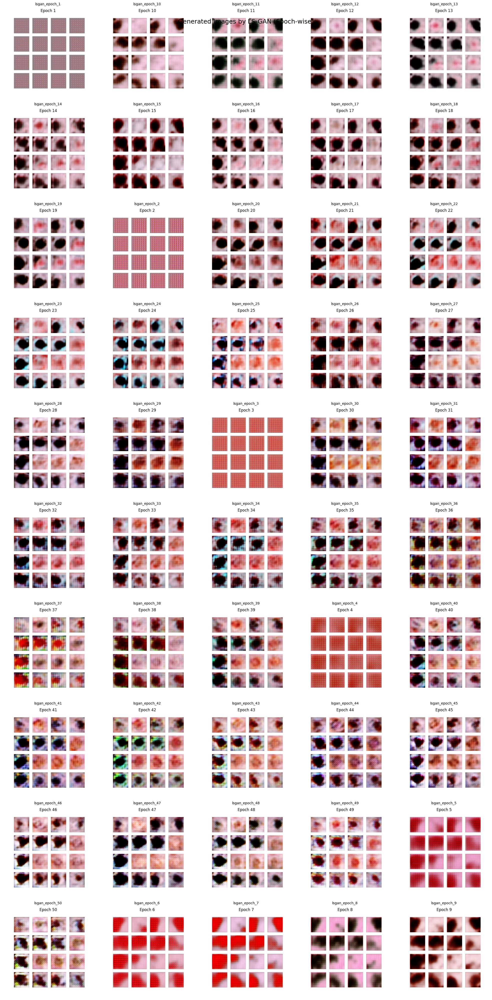

In [10]:
import matplotlib.pyplot as plt
import os
from PIL import Image

# Path to generated images
img_dir = './generated_images'

# List saved images
generated_imgs = sorted([img for img in os.listdir(img_dir) if img.endswith('.png')])

# Plot all saved generated image outputs (epoch-wise)
n_cols = 5
n_rows = (len(generated_imgs) + n_cols - 1) // n_cols
plt.figure(figsize=(n_cols * 4, n_rows * 4))

for idx, img_name in enumerate(generated_imgs):
    img_path = os.path.join(img_dir, img_name)
    img = Image.open(img_path)

    plt.subplot(n_rows, n_cols, idx + 1)
    plt.imshow(img)
    plt.title(img_name.replace(".png", ""), fontsize=10)
    plt.axis('off')

plt.tight_layout()
plt.suptitle("Generated Images by LS-GAN (Epoch-wise)", fontsize=18)
plt.show()


In [13]:
import tensorflow_hub as hub
import tensorflow as tf
from tensorflow.keras.applications.inception_v3 import InceptionV3, preprocess_input
from scipy.linalg import sqrtm
import numpy as np

# Load InceptionV3 model (no top, just features)
inception_model = InceptionV3(include_top=False, pooling='avg', input_shape=(299, 299, 3))


In [14]:
def get_activations(images, model):
    images = preprocess_input(images)
    return model.predict(images, batch_size=32)

def calculate_fid(act1, act2):
    mu1, sigma1 = act1.mean(axis=0), np.cov(act1, rowvar=False)
    mu2, sigma2 = act2.mean(axis=0), np.cov(act2, rowvar=False)
    ssdiff = np.sum((mu1 - mu2) ** 2.0)
    covmean = sqrtm(sigma1.dot(sigma2))
    if np.iscomplexobj(covmean):
        covmean = covmean.real
    return ssdiff + np.trace(sigma1 + sigma2 - 2.0 * covmean)

def calculate_inception_score(preds, splits=10):
    scores = []
    preds = np.clip(preds, 1e-10, 1.0)
    for i in range(splits):
        part = preds[i * (len(preds) // splits): (i + 1) * (len(preds) // splits), :]
        kl = part * (np.log(part) - np.log(np.expand_dims(np.mean(part, axis=0), 0)))
        kl = np.mean(np.sum(kl, axis=1))
        scores.append(np.exp(kl))
    return np.mean(scores), np.std(scores)


In [15]:
def evaluate_generated_images(generator, real_dataset, num_images=500):
    BATCH_SIZE = 64
    noise_dim = 100
    generated_images = []
    for _ in range(num_images // BATCH_SIZE):
        noise = tf.random.normal([BATCH_SIZE, noise_dim])
        gen_imgs = generator(noise, training=False)
        generated_images.append(gen_imgs)
    
    generated_images = tf.concat(generated_images, axis=0)
    generated_images = (generated_images + 1.0) / 2.0
    generated_images = tf.image.resize(generated_images, [299, 299]).numpy()

    real_images = []
    for batch in real_dataset.take(num_images // BATCH_SIZE):
        batch = (batch + 1.0) / 2.0
        real_images.append(tf.image.resize(batch, [299, 299]))
    real_images = tf.concat(real_images, axis=0).numpy()

    print("Extracting Inception features...")
    act_real = get_activations(real_images, inception_model)
    act_fake = get_activations(generated_images, inception_model)

    fid = calculate_fid(act_real, act_fake)

    # Optional: Use InceptionV3 classifier head for IS (more accurate: use TF Hub Inception with logits)
    from tensorflow.keras.applications.inception_v3 import decode_predictions
    classifier = tf.keras.applications.InceptionV3(include_top=True, weights="imagenet")
    preds = classifier.predict(preprocess_input(generated_images), batch_size=32)
    is_mean, is_std = calculate_inception_score(preds)

    print(f"\n✅ Fréchet Inception Distance (FID): {fid:.4f}")
    print(f"✅ Inception Score (IS): {is_mean:.4f} ± {is_std:.4f}")


In [16]:
evaluate_generated_images(generator, train_dataset, num_images=500)


Extracting Inception features...
14/14 [==============================] - 2s 83ms/step

✅ Fréchet Inception Distance (FID): 0.1656
✅ Inception Score (IS): 1.0000 ± 0.0000


WGAN

In [3]:
import os
import numpy as np
import tensorflow as tf
from tensorflow.keras import layers
import matplotlib.pyplot as plt

# Config
EPOCHS = 50
BATCH_SIZE = 64
NOISE_DIM = 100
NUM_EXAMPLES_TO_GENERATE = 16
CLIP_VALUE = 0.01  # WGAN-specific weight clipping
CRITIC_ITER = 5    # Train critic 5 times per generator update

LOG_DIR = "./logs/wgan"
IMG_SAVE_DIR = "./generated_images_wgan"
os.makedirs(IMG_SAVE_DIR, exist_ok=True)


In [4]:
data = np.load(r"C:\Users\laksh\Downloads\dermamnist_224.npz")
images = data['train_images']

def data_gen():
    for img in images:
        yield img

raw_dataset = tf.data.Dataset.from_generator(
    data_gen,
    output_signature=tf.TensorSpec(shape=(224, 224, 3), dtype=tf.uint8)
)

def preprocess_pipeline(img):
    img = tf.image.resize(img, [64, 64])
    img = tf.cast(img, tf.float32) / 127.5 - 1.0
    return img

train_dataset = raw_dataset.map(preprocess_pipeline, num_parallel_calls=tf.data.AUTOTUNE)
train_dataset = train_dataset.shuffle(10000).batch(BATCH_SIZE).prefetch(tf.data.AUTOTUNE)


In [5]:
def build_generator():
    model = tf.keras.Sequential([
        layers.Dense(8*8*256, use_bias=False, input_shape=(NOISE_DIM,)),
        layers.BatchNormalization(), layers.LeakyReLU(),
        layers.Reshape((8, 8, 256)),
        layers.Conv2DTranspose(128, 5, strides=2, padding='same', use_bias=False),
        layers.BatchNormalization(), layers.LeakyReLU(),
        layers.Conv2DTranspose(64, 5, strides=2, padding='same', use_bias=False),
        layers.BatchNormalization(), layers.LeakyReLU(),
        layers.Conv2DTranspose(3, 5, strides=2, padding='same', use_bias=False, activation='tanh')
    ])
    return model

def build_critic():
    model = tf.keras.Sequential([
        layers.Conv2D(64, 5, strides=2, padding='same', input_shape=(64, 64, 3)),
        layers.LeakyReLU(), layers.Dropout(0.3),
        layers.Conv2D(128, 5, strides=2, padding='same'),
        layers.LeakyReLU(), layers.Dropout(0.3),
        layers.Flatten(), layers.Dense(1)  # No sigmoid!
    ])
    return model


In [6]:
def critic_loss(real_output, fake_output):
    return tf.reduce_mean(fake_output) - tf.reduce_mean(real_output)

def generator_loss(fake_output):
    return -tf.reduce_mean(fake_output)


In [7]:
generator = build_generator()
critic = build_critic()

generator_optimizer = tf.keras.optimizers.RMSprop(learning_rate=5e-5)
critic_optimizer = tf.keras.optimizers.RMSprop(learning_rate=5e-5)

seed = tf.random.normal([NUM_EXAMPLES_TO_GENERATE, NOISE_DIM])
summary_writer = tf.summary.create_file_writer(LOG_DIR)


In [8]:
@tf.function
def train_critic_step(images):
    noise = tf.random.normal([BATCH_SIZE, NOISE_DIM])
    with tf.GradientTape() as tape:
        fake_images = generator(noise, training=True)
        real_output = critic(images, training=True)
        fake_output = critic(fake_images, training=True)
        loss = critic_loss(real_output, fake_output)
    gradients = tape.gradient(loss, critic.trainable_variables)
    critic_optimizer.apply_gradients(zip(gradients, critic.trainable_variables))
    for var in critic.trainable_variables:
        var.assign(tf.clip_by_value(var, -CLIP_VALUE, CLIP_VALUE))
    return loss

@tf.function
def train_generator_step():
    noise = tf.random.normal([BATCH_SIZE, NOISE_DIM])
    with tf.GradientTape() as tape:
        fake_images = generator(noise, training=True)
        fake_output = critic(fake_images, training=True)
        loss = generator_loss(fake_output)
    gradients = tape.gradient(loss, generator.trainable_variables)
    generator_optimizer.apply_gradients(zip(gradients, generator.trainable_variables))
    return loss


In [9]:
def generate_and_save_images(model, epoch, test_input):
    predictions = model(test_input, training=False)
    predictions = (predictions + 1.0) / 2.0
    fig = plt.figure(figsize=(4, 4))
    for i in range(predictions.shape[0]):
        plt.subplot(4, 4, i + 1)
        plt.imshow(predictions[i])
        plt.axis('off')
    plt.suptitle(f"Epoch {epoch}")
    plt.savefig(f"{IMG_SAVE_DIR}/wgan_epoch_{epoch}.png")
    plt.close()


In [10]:
for epoch in range(1, EPOCHS + 1):
    gen_loss = 0
    disc_loss = 0
    for image_batch in train_dataset:
        for _ in range(CRITIC_ITER):
            disc_loss = train_critic_step(image_batch)
        gen_loss = train_generator_step()

    if epoch % 10 == 0 or epoch == 1:
        generate_and_save_images(generator, epoch, seed)

    with summary_writer.as_default():
        tf.summary.scalar("Generator Loss", gen_loss, step=epoch)
        tf.summary.scalar("Critic Loss", disc_loss, step=epoch)

    print(f"Epoch {epoch}: Generator Loss = {gen_loss:.4f}, Critic Loss = {disc_loss:.4f}")


Epoch 1: Generator Loss = -6.1174, Critic Loss = -11.3262
Epoch 2: Generator Loss = 3.2931, Critic Loss = -6.2846
Epoch 3: Generator Loss = 2.7980, Critic Loss = -2.8293
Epoch 4: Generator Loss = -2.9879, Critic Loss = -2.4525
Epoch 5: Generator Loss = -7.1425, Critic Loss = -1.1906
Epoch 6: Generator Loss = -17.5589, Critic Loss = -1.9222
Epoch 7: Generator Loss = -33.5221, Critic Loss = -4.0067
Epoch 8: Generator Loss = -11.1666, Critic Loss = -1.3802
Epoch 9: Generator Loss = -11.7759, Critic Loss = -0.8825
Epoch 10: Generator Loss = -1.1975, Critic Loss = -2.2017
Epoch 11: Generator Loss = -15.8669, Critic Loss = -2.9898
Epoch 12: Generator Loss = -1.2659, Critic Loss = -1.7882
Epoch 13: Generator Loss = 11.4608, Critic Loss = 4.4103
Epoch 14: Generator Loss = -17.7760, Critic Loss = -1.8243
Epoch 15: Generator Loss = 18.2896, Critic Loss = -2.0190
Epoch 16: Generator Loss = -6.5900, Critic Loss = 0.2565
Epoch 17: Generator Loss = -6.9821, Critic Loss = -0.6362
Epoch 18: Generator 

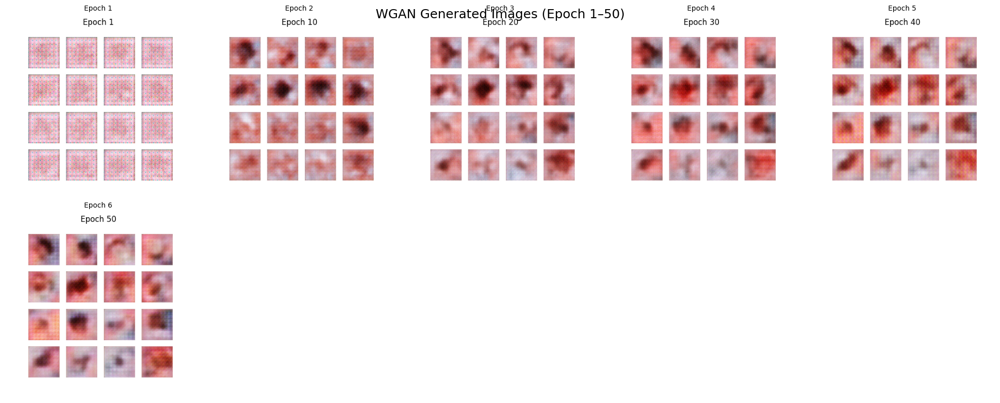

In [13]:
import matplotlib.pyplot as plt
from PIL import Image
import os

# Directory where you saved WGAN generated images
image_dir = "./generated_images_wgan"

# Get all images sorted by epoch
image_files = sorted([img for img in os.listdir(image_dir) if img.endswith('.png')],
                     key=lambda x: int(x.split('_')[-1].split('.')[0]))  # e.g., wgan_epoch_1.png

# Plot settings
n_cols = 5
n_rows = (len(image_files) + n_cols - 1) // n_cols

# Display grid
plt.figure(figsize=(n_cols * 4, n_rows * 4))
for idx, img_name in enumerate(image_files):
    img_path = os.path.join(image_dir, img_name)
    img = Image.open(img_path)
    
    plt.subplot(n_rows, n_cols, idx + 1)
    plt.imshow(img)
    plt.title(f"Epoch {idx + 1}", fontsize=10)
    plt.axis("off")

plt.tight_layout()
plt.suptitle("WGAN Generated Images (Epoch 1–50)", fontsize=18)
plt.show()


In [14]:
from tensorflow.keras.applications.inception_v3 import InceptionV3, preprocess_input
from scipy.linalg import sqrtm
import numpy as np

# Load InceptionV3 for activations
inception_model = InceptionV3(include_top=False, pooling='avg', input_shape=(299, 299, 3))

# Feature extraction
def get_activations(images, model):
    images = preprocess_input(images)
    return model.predict(images, batch_size=32)

def calculate_fid(act1, act2):
    mu1, sigma1 = act1.mean(axis=0), np.cov(act1, rowvar=False)
    mu2, sigma2 = act2.mean(axis=0), np.cov(act2, rowvar=False)
    ssdiff = np.sum((mu1 - mu2) ** 2.0)
    covmean = sqrtm(sigma1.dot(sigma2))
    if np.iscomplexobj(covmean):
        covmean = covmean.real
    return ssdiff + np.trace(sigma1 + sigma2 - 2.0 * covmean)

def calculate_inception_score(preds, splits=10):
    scores = []
    preds = np.clip(preds, 1e-10, 1.0)
    for i in range(splits):
        part = preds[i * (len(preds) // splits): (i + 1) * (len(preds) // splits), :]
        kl = part * (np.log(part) - np.log(np.expand_dims(np.mean(part, axis=0), 0)))
        kl = np.mean(np.sum(kl, axis=1))
        scores.append(np.exp(kl))
    return np.mean(scores), np.std(scores)


In [15]:
def evaluate_wgan(generator, real_dataset, num_images=500):
    print(f"\nEvaluating WGAN with {num_images} images...")
    BATCH_SIZE = 64

    # Generate fake images
    fake_images = []
    for _ in range(num_images // BATCH_SIZE):
        noise = tf.random.normal([BATCH_SIZE, NOISE_DIM])
        gen = generator(noise, training=False)
        fake_images.append(gen)
    fake_images = tf.concat(fake_images, axis=0)
    fake_images = tf.image.resize((fake_images + 1.0) / 2.0, [299, 299])  # [0, 1] RGB

    # Real images
    real_images = []
    for batch in real_dataset.take(num_images // BATCH_SIZE):
        batch = tf.image.resize((batch + 1.0) / 2.0, [299, 299])
        real_images.append(batch)
    real_images = tf.concat(real_images, axis=0)

    # Activations
    act_real = get_activations(real_images.numpy(), inception_model)
    act_fake = get_activations(fake_images.numpy(), inception_model)

    # FID
    fid_score = calculate_fid(act_real, act_fake)

    # Inception Score (using logits)
    classifier = tf.keras.applications.InceptionV3(include_top=True, weights="imagenet")
    pred_logits = classifier.predict(preprocess_input(fake_images.numpy()), batch_size=32)
    is_score, is_std = calculate_inception_score(pred_logits)

    print(f"✅ WGAN FID: {fid_score:.4f}")
    print(f"✅ WGAN IS: {is_score:.4f} ± {is_std:.4f}")


In [16]:
evaluate_wgan(generator, train_dataset, num_images=500)



Evaluating WGAN with 500 images...
14/14 [==============================] - 2s 82ms/step
✅ WGAN FID: 0.0957
✅ WGAN IS: 1.0000 ± 0.0000


WGAN-GP

In [25]:
import os
import numpy as np
import tensorflow as tf
from tensorflow.keras import layers
import matplotlib.pyplot as plt

# Config
EPOCHS = 50
BATCH_SIZE = 64
NOISE_DIM = 100
NUM_EXAMPLES_TO_GENERATE = 16
LAMBDA_GP = tf.constant(10.0, dtype=tf.float32)
CRITIC_ITER = 5

LOG_DIR = "./logs/wgan_gp"
IMG_SAVE_DIR = "./generated_images_wgan_gp"
os.makedirs(IMG_SAVE_DIR, exist_ok=True)


In [26]:
data = np.load(r"C:\Users\laksh\Downloads\dermamnist_224.npz")
images = data['train_images']

def data_gen():
    for img in images:
        yield img

raw_dataset = tf.data.Dataset.from_generator(
    data_gen,
    output_signature=tf.TensorSpec(shape=(224, 224, 3), dtype=tf.uint8)
)

def preprocess_pipeline(img):
    img = tf.image.resize(img, [64, 64])
    img = tf.cast(img, tf.float32) / 127.5 - 1.0
    return img

train_dataset = raw_dataset.map(preprocess_pipeline, num_parallel_calls=tf.data.AUTOTUNE)
train_dataset = train_dataset.shuffle(10000).batch(BATCH_SIZE).prefetch(tf.data.AUTOTUNE)


In [27]:
def build_generator():
    model = tf.keras.Sequential([
        layers.Dense(8*8*256, use_bias=False, input_shape=(NOISE_DIM,)),
        layers.BatchNormalization(), layers.LeakyReLU(),
        layers.Reshape((8, 8, 256)),
        layers.Conv2DTranspose(128, 5, strides=2, padding='same', use_bias=False),
        layers.BatchNormalization(), layers.LeakyReLU(),
        layers.Conv2DTranspose(64, 5, strides=2, padding='same', use_bias=False),
        layers.BatchNormalization(), layers.LeakyReLU(),
        layers.Conv2DTranspose(3, 5, strides=2, padding='same', use_bias=False, activation='tanh')
    ])
    return model

def build_critic():
    model = tf.keras.Sequential([
        layers.Conv2D(64, 5, strides=2, padding='same', input_shape=(64, 64, 3)),
        layers.LeakyReLU(), layers.Dropout(0.3),
        layers.Conv2D(128, 5, strides=2, padding='same'),
        layers.LeakyReLU(), layers.Dropout(0.3),
        layers.Flatten(), layers.Dense(1)
    ])
    return model


In [28]:
def generator_loss(fake_output):
    return -tf.reduce_mean(fake_output)

def critic_loss(real_output, fake_output):
    return tf.reduce_mean(fake_output) - tf.reduce_mean(real_output)

def gradient_penalty(critic, real_images, fake_images):
    batch_size = tf.shape(real_images)[0]
    epsilon = tf.random.uniform([batch_size, 1, 1, 1], 0.0, 1.0)
    interpolated = epsilon * real_images + (1 - epsilon) * fake_images

    with tf.GradientTape() as tape:
        tape.watch(interpolated)
        pred = critic(interpolated)
    grads = tape.gradient(pred, [interpolated])[0]
    norm = tf.sqrt(tf.reduce_sum(tf.square(grads), axis=[1, 2, 3]) + 1e-10)
    penalty = tf.reduce_mean((norm - 1.0) ** 2)
    return penalty


In [29]:
generator = build_generator()
critic = build_critic()

generator_optimizer = tf.keras.optimizers.Adam(1e-4, beta_1=0.5, beta_2=0.9)
critic_optimizer = tf.keras.optimizers.Adam(1e-4, beta_1=0.5, beta_2=0.9)

seed = tf.random.normal([NUM_EXAMPLES_TO_GENERATE, NOISE_DIM])
summary_writer = tf.summary.create_file_writer(LOG_DIR)


In [30]:
@tf.function
def train_critic_step(real_images):
    noise = tf.random.normal([tf.shape(real_images)[0], NOISE_DIM])
    with tf.GradientTape() as tape:
        fake_images = generator(noise, training=True)
        real_output = critic(real_images, training=True)
        fake_output = critic(fake_images, training=True)
        gp = gradient_penalty(critic, real_images, fake_images)
        loss = critic_loss(real_output, fake_output) + LAMBDA_GP * gp
    grads = tape.gradient(loss, critic.trainable_variables)
    critic_optimizer.apply_gradients(zip(grads, critic.trainable_variables))
    return loss

@tf.function
def train_generator_step(batch_size):
    noise = tf.random.normal([batch_size, NOISE_DIM])
    with tf.GradientTape() as tape:
        fake_images = generator(noise, training=True)
        fake_output = critic(fake_images, training=True)
        loss = generator_loss(fake_output)
    grads = tape.gradient(loss, generator.trainable_variables)
    generator_optimizer.apply_gradients(zip(grads, generator.trainable_variables))
    return loss


In [31]:
def generate_and_save_images(model, epoch, test_input):
    predictions = model(test_input, training=False)
    predictions = (predictions + 1.0) / 2.0
    fig = plt.figure(figsize=(4, 4))
    for i in range(predictions.shape[0]):
        plt.subplot(4, 4, i + 1)
        plt.imshow(predictions[i])
        plt.axis("off")
    plt.suptitle(f"WGAN-GP - Epoch {epoch}")
    plt.savefig(f"{IMG_SAVE_DIR}/wgan_gp_epoch_{epoch}.png")
    plt.close()


In [33]:
for epoch in range(1, EPOCHS + 1):
    gen_loss, disc_loss = 0, 0
    for real_batch in train_dataset:
        for _ in range(CRITIC_ITER):
            disc_loss = train_critic_step(real_batch)
        gen_loss = train_generator_step(tf.shape(real_batch)[0])

    if epoch % 10 == 0 or epoch == 1:
        generate_and_save_images(generator, epoch, seed)

    with summary_writer.as_default():
        tf.summary.scalar("Generator Loss", gen_loss, step=epoch)
        tf.summary.scalar("Critic Loss", disc_loss, step=epoch)

    print(f"Epoch {epoch}: Gen Loss = {gen_loss:.4f}, Critic Loss = {disc_loss:.4f}")


Epoch 1: Gen Loss = -16.2395, Critic Loss = -3.1229
Epoch 2: Gen Loss = 5.2751, Critic Loss = -2.5717
Epoch 3: Gen Loss = -1.8053, Critic Loss = -1.7403
Epoch 4: Gen Loss = -5.5679, Critic Loss = 0.4738
Epoch 5: Gen Loss = -35.9006, Critic Loss = -4.2841
Epoch 6: Gen Loss = -22.6609, Critic Loss = -2.4366
Epoch 7: Gen Loss = -23.4595, Critic Loss = -1.2079
Epoch 8: Gen Loss = -13.3540, Critic Loss = -5.0254
Epoch 9: Gen Loss = -20.6636, Critic Loss = -2.3649
Epoch 10: Gen Loss = -1.6554, Critic Loss = -6.3865
Epoch 11: Gen Loss = -17.6833, Critic Loss = -0.6151
Epoch 12: Gen Loss = -36.0495, Critic Loss = -2.7433
Epoch 13: Gen Loss = -0.7115, Critic Loss = -2.0963
Epoch 14: Gen Loss = 2.2526, Critic Loss = -2.9053
Epoch 15: Gen Loss = -5.7015, Critic Loss = -2.1891
Epoch 16: Gen Loss = -23.8294, Critic Loss = -3.0769
Epoch 17: Gen Loss = -4.9829, Critic Loss = 0.5690
Epoch 18: Gen Loss = -21.2234, Critic Loss = -3.1752
Epoch 19: Gen Loss = -23.2861, Critic Loss = -4.7006
Epoch 20: Gen 

14/14 [==============================] - 3s 102ms/step


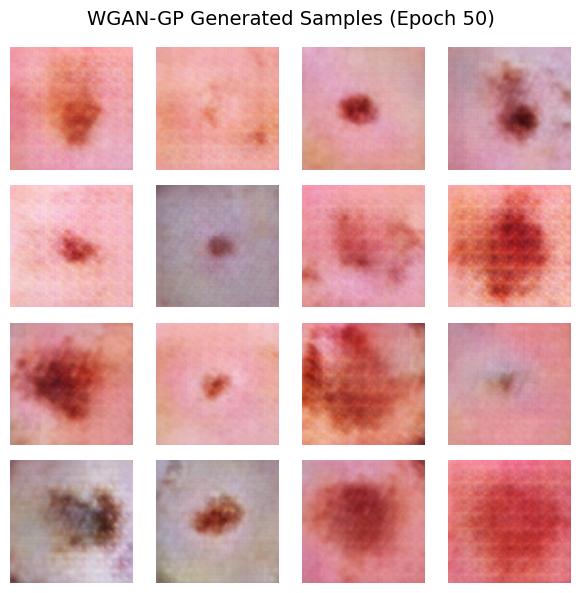

✅ FID: 0.0278
✅ IS: 1.0001 ± 0.0000


In [34]:
from tensorflow.keras.applications.inception_v3 import InceptionV3, preprocess_input
from scipy.linalg import sqrtm
import numpy as np
import matplotlib.pyplot as plt

# Inception Models
inception_model = InceptionV3(include_top=False, pooling='avg', input_shape=(299, 299, 3))
classifier_model = tf.keras.applications.InceptionV3(include_top=True, weights='imagenet')

# Generate fake images
def generate_images(generator, num_images=500):
    images = []
    for _ in range(num_images // BATCH_SIZE):
        noise = tf.random.normal([BATCH_SIZE, NOISE_DIM])
        fake = generator(noise, training=False)
        images.append(fake)
    images = tf.concat(images, axis=0)
    images = (images + 1.0) / 2.0
    images = tf.image.resize(images, [299, 299])
    return images

# Get real images
def get_real_images(dataset, num_images=500):
    real_images = []
    for batch in dataset.take(num_images // BATCH_SIZE):
        real_images.append(tf.image.resize((batch + 1.0) / 2.0, [299, 299]))
    return tf.concat(real_images, axis=0)

# Activations
def get_activations(images, model):
    images = preprocess_input(images)
    return model.predict(images, batch_size=32)

# FID
def calculate_fid(act1, act2):
    mu1, sigma1 = act1.mean(axis=0), np.cov(act1, rowvar=False)
    mu2, sigma2 = act2.mean(axis=0), np.cov(act2, rowvar=False)
    ssdiff = np.sum((mu1 - mu2) ** 2)
    covmean = sqrtm(sigma1 @ sigma2)
    if np.iscomplexobj(covmean):
        covmean = covmean.real
    return ssdiff + np.trace(sigma1 + sigma2 - 2.0 * covmean)

# IS
def calculate_inception_score(preds, splits=10):
    scores = []
    preds = np.clip(preds, 1e-10, 1.0)
    for i in range(splits):
        part = preds[i * (len(preds) // splits):(i + 1) * (len(preds) // splits), :]
        kl = part * (np.log(part) - np.log(np.expand_dims(np.mean(part, axis=0), 0)))
        scores.append(np.exp(np.mean(np.sum(kl, axis=1))))
    return np.mean(scores), np.std(scores)

# Run evaluation
fake_images = generate_images(generator, 500)
real_images = get_real_images(train_dataset, 500)

act_fake = get_activations(fake_images.numpy(), inception_model)
act_real = get_activations(real_images.numpy(), inception_model)

fid_score = calculate_fid(act_real, act_fake)

preds = classifier_model.predict(preprocess_input(fake_images.numpy()), batch_size=32)
is_mean, is_std = calculate_inception_score(preds)

# Plot a few generated samples
plt.figure(figsize=(6, 6))
for i in range(16):
    plt.subplot(4, 4, i + 1)
    plt.imshow(fake_images[i])
    plt.axis("off")
plt.suptitle("WGAN-GP Generated Samples (Epoch 50)", fontsize=14)
plt.tight_layout()
plt.show()

print(f"✅ FID: {fid_score:.4f}")
print(f"✅ IS: {is_mean:.4f} ± {is_std:.4f}")
